# Data Organizer

This Jupyter Notebook will serve the purpose of removing all the data files that we don't want



In [2]:
import os
import pandas as pd

## Commented Code

The commented code has already been run and is commented out to prevent errors since file structures have changed

In [2]:
'''
#Change directory to the data directory
os.chdir("/Users/adish/Documents/School/Fall 2021 Courses/Deep Learning - Signals/Final Project/EMGGestureClassification/Data/Data-HDF5")

#now we can print out all of the data files that end in .hdf5
for filename in os.listdir():
    if filename.endswith(".hdf5"):
        print(filename)
'''

'\n#Change directory to the data directory\nos.chdir("/Users/adish/Documents/School/Fall 2021 Courses/Deep Learning - Signals/Final Project/EMGGestureClassification/Data/Data-HDF5")\n\n#now we can print out all of the data files that end in .hdf5\nfor filename in os.listdir():\n    if filename.endswith(".hdf5"):\n        print(filename)\n'

In [3]:
'''
for filename in os.listdir():
    if filename.endswith(".hdf5") and 'sequential' in filename:
        print(filename)
'''

'\nfor filename in os.listdir():\n    if filename.endswith(".hdf5") and \'sequential\' in filename:\n        print(filename)\n'

In [4]:
'''
os.mkdir("sequential")
os.mkdir("repeats-long")
os.mkdir("repeats-short")
'''

'\nos.mkdir("sequential")\nos.mkdir("repeats-long")\nos.mkdir("repeats-short")\n'

In [3]:
base = "/Users/adish/Documents/School/Fall 2021 Courses/Deep Learning - Signals/Final Project/EMGGestureClassification/Data/Data-HDF5"

seq = os.path.join(base,"sequential")
repLong = os.path.join(base,"repeats-long")
repShort = os.path.join(base,"repeats-short")

In [6]:
'''
# import shutil
#Now we can move the files above to another location so we can process it
for filename in os.listdir():
    if filename.endswith(".hdf5") and 'sequential' in filename:
        print("Moving {}".format(filename))
        shutil.move(os.path.join(base,filename),seq)
    if filename.endswith(".hdf5") and 'repeats_long' in filename:
        print("Moving {}".format(filename))
        shutil.move(os.path.join(base,filename),repLong)
    if filename.endswith(".hdf5") and 'repeats_short' in filename:
        print("Moving {}".format(filename))
        shutil.move(os.path.join(base,filename),repShort)
'''

'\n# import shutil\n#Now we can move the files above to another location so we can process it\nfor filename in os.listdir():\n    if filename.endswith(".hdf5") and \'sequential\' in filename:\n        print("Moving {}".format(filename))\n        shutil.move(os.path.join(base,filename),seq)\n    if filename.endswith(".hdf5") and \'repeats_long\' in filename:\n        print("Moving {}".format(filename))\n        shutil.move(os.path.join(base,filename),repLong)\n    if filename.endswith(".hdf5") and \'repeats_short\' in filename:\n        print("Moving {}".format(filename))\n        shutil.move(os.path.join(base,filename),repShort)\n'

In [11]:
os.chdir(seq)
filename = os.listdir()[0]
data = pd.read_hdf(filename)
data = data.iloc[:,1:25]
data.head()

,EMG_2,EMG_3,EMG_4,EMG_5,EMG_6,EMG_7,EMG_8,EMG_9,EMG_10,EMG_11,...,EMG_16,EMG_17,EMG_18,EMG_19,EMG_20,EMG_21,EMG_22,EMG_23,EMG_24,TRAJ_1
-0.058426,-3.0,-3.0,-1.0,-4.0,-5.0,-6.0,-5.0,-3.0,-4.0,-3.0,...,-2.0,-3.0,-3.0,-3.0,-3.0,-2.0,-3.0,-3.0,-3.0,-1.0
-0.058230,3.0,3.0,3.0,1.0,-2.0,-2.0,0.0,1.0,2.0,3.0,...,4.0,-3.0,0.0,-1.0,-1.0,0.0,0.0,-2.0,-1.0,-1.0
-0.058035,18.0,17.0,16.0,15.0,6.0,8.0,12.0,12.0,16.0,14.0,...,17.0,0.0,8.0,5.0,3.0,6.0,3.0,4.0,5.0,-1.0
-0.057840,30.0,31.0,27.0,26.0,16.0,17.0,22.0,22.0,27.0,23.0,...,28.0,0.0,15.0,10.0,8.0,13.0,6.0,9.0,11.0,-1.0
-0.057645,34.0,35.0,31.0,30.0,21.0,19.0,26.0,25.0,30.0,27.0,...,32.0,0.0,17.0,13.0,9.0,14.0,8.0,10.0,13.0,-1.0


In [8]:
#import our module
from DataExtractor import hdfSlidingData

window = 1347583 #Set a default window size
slider = hdfSlidingData(window)
#define file paths
base = "/Users/adish/Documents/School/Fall 2021 Courses/Deep Learning - Signals/Final Project/EMGGestureClassification/Data/Data-HDF5"

seq = os.path.join(base,"sequential")
repLong = os.path.join(base,"repeats-long")
repShort = os.path.join(base,"repeats-short")

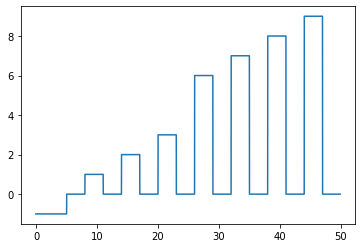

In [14]:
import matplotlib.pyplot as plt
#try running our class on one file
os.chdir(seq)
filename = os.listdir()[0]

data = pd.read_hdf(filename)
sliceEnd = 256_000
plt.plot(data.index[:sliceEnd],data.iloc[:sliceEnd,24])


In [35]:
df = data.iloc[7311:8311,0:25]

cols = df.columns

In [37]:
from statistics import mode
mode(df[cols[-1]].values.tolist()[:10])

-1.0

In [8]:
desktop = "/Users/adish/Desktop"
import json

In [12]:
os.chdir(desktop)
for file in os.listdir():
    if file.endswith('.json'):
        print(file)
        with open(file) as f:
            data = json.load(f)
        emg1 = data['data']['emg1']
        print(len(emg1))

emg_gestures-10-sequential-2018-04-05-10-14-14-029-2.json
256000


In [8]:
base = "/Users/adish/Documents/School/Fall 2021 Courses/Deep Learning - Signals/Final Project/EMGGestureClassification/Data/sequential/jsonOut4"
os.chdir(base)
import shutil

In [9]:
for i,filename in enumerate(os.listdir()):
    if filename.endswith('.json'):
        #we want to save roughly 1000 files per folder
        print("Reading {}".format(filename))
        if i % 1000 == 0:
            #we want to try to make a new directory
            outDir = "Seperated{}".format(i)
            if not os.path.exists(os.path.join(base,outDir)):
                #then make the directory
                print("Made {}".format(outDir))
                os.mkdir(os.path.join(base,outDir))
        shutil.move(os.path.join(base,filename),os.path.join(base,outDir))
        

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50530.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135403.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135815.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108392.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-856.json
Made Seperated1000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75042

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184064.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171931.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165837.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121293.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141191.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64038.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19508.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171659.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172976.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95884.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113073.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38740.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39628.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150368.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109242.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79870.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172599.json
Made Seperated4000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200309.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55773.

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62953.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35021.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86752.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83383.json
Reading emg_gestur

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73587.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208555.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180965.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28490.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98873.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179156.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90540.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70714.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122780.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126669.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199569.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227538.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179947.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250686.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241078.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91756.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123555.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142046.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169316.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40418.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16278.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128749.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74844.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42833.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41966.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216422.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102064.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226094.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184459.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212174.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222346.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225529.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139949.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18374.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129949.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160025.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75644.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17202.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227328.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72752.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118081.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75428.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136429.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157839.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147205.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231593.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60903.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4166.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126203.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217622.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58655.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245847.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96945.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53388.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82681.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170571.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126311.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18620.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191421.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170967.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230156.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145003.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138533.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188529.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149535.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148324.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30901.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172612.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228511.json
Reading emg_gestu

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186540.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119219.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123888.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207194.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174816.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237871.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109075.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92422.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130965.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190569.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224135.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89281.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76459.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214350.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14273.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42413.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107196.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204080.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125788.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19284.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53428.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51415.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197310.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248982.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71735.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112228.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33815.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170814.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31828.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188289.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79581.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169418.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62267.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68685.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93337.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43306.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107991.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68543.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74560.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213591.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9430.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72359.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53111.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32402.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101428.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103415.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58927.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79329.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138315.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209108.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187445.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61871.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84827.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200542.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97837.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6907.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60919.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244870.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49418.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36953.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61021.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229793.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6911.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82320.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190284.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246508.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210368.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150173.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214956.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69153.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167938.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69446.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62573.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40547.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170086.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149241.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95519.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5687.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60689.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34938.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166555.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215491.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131461.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212354.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62749.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200040.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222074.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207005.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31151.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235898.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246636.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243988.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89202.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176847.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35846.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193057.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194792.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53405.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15320.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43540.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88444.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57344.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201811.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95124.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23510.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92032.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73924.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216511.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161496.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4278.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217615.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200754.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221009.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79754.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78846.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126776.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124032.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172652.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159502.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47190.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116006.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123348.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227431.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148186.json
Made Seperated44000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116505.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176312.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219534.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193939.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85098.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117969.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238005.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45800.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213355.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173901.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30900.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13276.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61997.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245954.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222490.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45461.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10138.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165772.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15156.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95903.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55965.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91782.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17583.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223956.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104689.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47688.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170032.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126652.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250828.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127940.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176723.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208485.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240351.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81844.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169340.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144828.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222486.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67156.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122980.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246378.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38281.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-355.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229419.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218850.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131284.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209257.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8257.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148827.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147681.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48814.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187126.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105763.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101235.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222783.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182689.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119890.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27508.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71368.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226685.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97841.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127254.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53599.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36860.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170360.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9954.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8646.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121945.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24277.json
Made Seperated60000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187022

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233887.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21976.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185859.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146194.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201734.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245493.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41459.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68734.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70754.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167108.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59439.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103863.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155215.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116227.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240360.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22469.json
Made Seperated63000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2454

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114587.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57586.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7296.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56544.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171741.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8708.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241033.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108459.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227965.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44191.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53091.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143108.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63427.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63831.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91422.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105504.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26257.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149339.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219067.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170111.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241137.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111269.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108731.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123461.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207491.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146998.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53245.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236289.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241459.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95764.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84899.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224735.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97165.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18283.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5911.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35729.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10871.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212579.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244319.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93872.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6844.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154120.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217147.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74360.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159991.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129543.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29823.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92799.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80570.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195311.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15624.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180543.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40238.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107295.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12227.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62060.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223459.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183416.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228215.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191581.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81418.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48521.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16356.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97041.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77215.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156828.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216760.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62017.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223091.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224754.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74086.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199980.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76812.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21530.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136946.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14804.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161464.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104564.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115660.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4635.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96579.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214024.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210964.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-368.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121041.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49310.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197025.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139471.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212324.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40074.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61379.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87153.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151656.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4377.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237656.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9953.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110966.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53064.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115267.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249360.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6560.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136638.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131057.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152579.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138626.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44534.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151355.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70968.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131954.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156490.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15491.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72955.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72810.json
Made Seperated83000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198329.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236728.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153104.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189241.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28880.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19261.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110970.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131000.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176421.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246187.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198684.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156078.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76107.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247796.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135106.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119593.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3109.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240680.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134982.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105676.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184998.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75300.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11041.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165333.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151396.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126614.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123945.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143344.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168014.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172360.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249966.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203626.json
Reading emg_gestu

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16442.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63407.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74268.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238599.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20065.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74546.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140883.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101530.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83468.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156111.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39585.json
Reading emg_gestu

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187731.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95695.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18958.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43009.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145551.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172788.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54689.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231645.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229849.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156042.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226250.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240086.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111526.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7035.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188128.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173025.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32019.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108091.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229799.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18108.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87651.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-485.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67055.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242003.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221487.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98320.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205971.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84753.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48192.json
Reading emg_gestu

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23599.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81947.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184275.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157038.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42659.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103665.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155005.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16004.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121344.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82111.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145005.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113665.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179869.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87606.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31232.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45173.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126897.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124844.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231310.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78319.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31376.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76612.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234057.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82956.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241157.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113408.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177749.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49278.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200621.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148909.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212309.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244569.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160599.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26260.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101989.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157594.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199368.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45430.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212098.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132882.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142903.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189807.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170034.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149066.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167837.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186571.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218529.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9179.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117689.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62169.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124690.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250091.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58994.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120811.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230901.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234942.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42422.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13587.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205570.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170425.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233911.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126245.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8103.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110377.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94046.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161473.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32864.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152606.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227753.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127706.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-328.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202734.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177661.json
Reading emg_gestur

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3734.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131451.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13006.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59645.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87797.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15306.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249418.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10041.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123968.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176027.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202299.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80681.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85179.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233878.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87847.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212626.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32599.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109750.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119245.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25749.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179844.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109245.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174775.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117871.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239560.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133138.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-386.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243111.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188555.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66686.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77994.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158134.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245246.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225847.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227179.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191518.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221873.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182713.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71708.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130734.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145634.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-719.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33594.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82665.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177250.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2797.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114457.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163839.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6691.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10098.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100101.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68250.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15760.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180954.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217916.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225534.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166800.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211968.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213955.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150461.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16398.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190796.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217853.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97719.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88815.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43911.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241419.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200046.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87719.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143888.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217296.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185652.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182197.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70158.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64818.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117543.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170887.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194239.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248854.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62309.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34569.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141909.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112487.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80025.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143871.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234734.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188758.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29530.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76034.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161812.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108462.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148769.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4507.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197593.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197086.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158968.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189098.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79355.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184079.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206517.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87689.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202411.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-723.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201006.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45797.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106796.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14632.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83808.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42681.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52394.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18884.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234124.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176894.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10237.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3796.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16619.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28032.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249814.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63575.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210894.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242560.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69206.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236764.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164542.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96061.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145423.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76888.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151731.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73223.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239810.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13967.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205355.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110801.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3490.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6368.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143130.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143075.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21904.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70458.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150462.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146365.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192194.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5006.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153188.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1415.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149585.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46086.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6846.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177642.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117956.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197103.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220689.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89084.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204505.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98553.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53457.json
Made Seperated131000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1268

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181311.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238485.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25681.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69815.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163178.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109159.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191080.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48020.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161684.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22685.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238344.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5381.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120058.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194847.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22113.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200907.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149679.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42006.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163292.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71273.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199977.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122788.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33903.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218766.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58667.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17676.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129347.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239742.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103606.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16067.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184996.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228016.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117700.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116111.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36594.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61731.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228368.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206685.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115506.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66918.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225366.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224127.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128014.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135149.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43206.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110342.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210194.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49488.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163284.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20285.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105814.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46815.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149680.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72449.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167228.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59719.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118725.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238846.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206017.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250677.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140337.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59152.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218992.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13204.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11239.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181976.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81800.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237101.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28338.json
Made Seperated143000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-335

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182032.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21267.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241046.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77112.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134113.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162773.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97346.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26234.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215924.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188583.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139672.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178387.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84086.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203223.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188645.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246003.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26737.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71746.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135082.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121215.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228962.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146328.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158336.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127284.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55921.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52837.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191599.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201160.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153716.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29883.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214677.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63686.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180873.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88123.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211727.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169943.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17046.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102627.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62146.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196698.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86701.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66555.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167232.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62453.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16196.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19326.json
Reading emg_gestur

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88461.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211770.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59241.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72111.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118787.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119196.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227992.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208228.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223178.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6974.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144505.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130982.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207348.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17284.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226415.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154285.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96890.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150415.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111949.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158025.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173375.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158863.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147411.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67997.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194963.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11184.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168978.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82241.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95584.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54960.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62501.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127968.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145354.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113534.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250800.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52508.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111509.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172924.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96080.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10002.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110461.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184962.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63193.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50309.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57136.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66846.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67754.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31134.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-384.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11097.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220606.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155753.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16752.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237593.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108285.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207125.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201788.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171125.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32124.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15257.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5420.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69875.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11351.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89158.json
Made Seperated161000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62405.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129034.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74181.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189184.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189887.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193073.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250512.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89334.json
Made Seperated162000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13395.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22831.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222504.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150394.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114930.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204123.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104176.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33236.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65456.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140681.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84910.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207888.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54425.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56418.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106720.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38211.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77579.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95710.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151881.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28138.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200072.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5524.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161021.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137641.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7519.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236005.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209101.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75616.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41349.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17529.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129018.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162949.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56463.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110660.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208086.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192072.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48754.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51430.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143594.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188490.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8228.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122984.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123696.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60697.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49684.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231979.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126210.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206309.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164960.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190331.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139809.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61194.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138961.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206165.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48703.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83607.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121243.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34422.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62242.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235605.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237638.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149967.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132480.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132879.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216889.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13244.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180798.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78065.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31909.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43765.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88661.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41758.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245638.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2408.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70843.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183858.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13194.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160523.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75342.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93241.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27648.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132029.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245141.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136969.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224901.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225613.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150746.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238534.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245004.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38801.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211659.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247039.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166731.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183049.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96628.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181074.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84300.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37865.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57264.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230295.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114265.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119284.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216124.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25788.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163071.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226087.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102077.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131760.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217257.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102903.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134562.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26995.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243959.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77830.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46394.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212110.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199576.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8926.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209160.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222230.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213994.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247760.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211100.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20791.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-229352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32981.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28175.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72366.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187753.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167507.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151966.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212452.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12967.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212517.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224976.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34910.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172640.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87275.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192414.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140361.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55500.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199171.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104615.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58918.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172990.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143234.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168164.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62809.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121808.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173682.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101944.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238685.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64031.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84265.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171650.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222508.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216954.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16461.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25244.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73424.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166245.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130425.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164278.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132418.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240288.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153222.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247664.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211004.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204343.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164917.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227423.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128783.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47317.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152576.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130219.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55957.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116956.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141024.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54645.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228447.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63023.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246472.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90772.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185113.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91163.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7796.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152937.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190254.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202690.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126660.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205155.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87408.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133462.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165202.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210357.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1707.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149697.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46802.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11170.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47710.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95622.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212487.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215342.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118933.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132571.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164311.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216581.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71570.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238129.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188536.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112597.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147308.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111568.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52569.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49325.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86632.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193053.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90709.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107900.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83826.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19887.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28323.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55613.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111303.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205745.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-197381.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18541.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104414.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247920.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128081.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45428.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13248.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40780.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227771.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150619.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106079.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13618.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165557.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140249.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55428.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175107.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207797.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195353.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142624.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125060.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173600.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86235.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193454.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194391.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206755.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130327.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225873.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10608.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97998.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100791.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21790.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210101.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1551.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162791.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243099.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59558.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164350.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132530.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213238.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238168.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46642.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231719.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147963.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203392.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64363.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25946.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42482.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101483.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166947.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38677.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106346.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150526.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98378.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129540.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7606.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40903.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184692.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247824.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157488.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227225.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228996.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55193.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219232.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116192.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232162.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79506.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52656.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99752.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48172.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83076.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52986.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47792.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183803.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40057.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23579.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136318.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25625.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119329.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71078.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246382.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149022.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241447.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122215.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250485.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86785.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211465.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225839.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164863.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45570.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222581.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150311.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106571.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245845.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-138589.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194949.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235614.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248324.json
Reading 

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11268.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38105.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150254.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99974.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83180.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48084.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204325.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111871.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86678.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84645.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19121.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101467.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242953.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61306.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96052.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116567.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120906.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177074.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92154.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241056.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217636.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-246793.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97356.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134103.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77102.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21762.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182537.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149433.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112318.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98220.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78074.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205871.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110325.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126217.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205522.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49683.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146816.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123015.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195421.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108345.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220729.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16387.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155386.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164822.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135987.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199547.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152443.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104223.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11442.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181659.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71594.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7135.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235205.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120951.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147495.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248735.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63950.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3199.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75538.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241451.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102965.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217231.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6661.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65611.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33071.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207118.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175788.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28797.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8556.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157616.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42077.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14617.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26336.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242206.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157952.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94106.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181767.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74352.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135694.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247004.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32498.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80846.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108943.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-907.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168342.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-143012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244782.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136112.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214870.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130880.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91241.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240684.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164674.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27675.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71015.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201058.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83505.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35131.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196364.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248934.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249626.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121842.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44588.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240057.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216637.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91492.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119597.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66416.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206322.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237886.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242986.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166976.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225442.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25977.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45376.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13516.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104464.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220494.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130838.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127304.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145938.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164273.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119743.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27272.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79022.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9107.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53133.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129176.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41227.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203032.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84297.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123828.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168179.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115449.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244805.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107531.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151351.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213177.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245717.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2527.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238227.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74186.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209983.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25023.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73643.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191726.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83682.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227347.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132813.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11213.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152212.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104472.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204098.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109305.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194461.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144283.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189603.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230197.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169457.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57166.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237652.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80041.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175474.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60215.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108144.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140043.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96316.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163723.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135143.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-20722.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76142.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148473.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71687.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132686.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216676.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212770.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150556.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213862.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106336.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38607.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137892.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74893.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13557.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209096.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45337.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225403.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111277.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147417.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204923.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235287.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171876.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232542.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219612.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-8242.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99237.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27233.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184066.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119702.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16997.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155996.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69063.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243114.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97229.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180475.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95214.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40924.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216271.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7621.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-132281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42919.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101918.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163324.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135544.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96711.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240807.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103533.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244147.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3377.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39942.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239477.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24673.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72013.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167672.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131012.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59343.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185895.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41704.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129455.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100738.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97931.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135476.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-163216.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96623.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211486.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244560.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107854.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160590.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23591.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105869.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97198.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72434.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13598.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128751.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40400.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155261.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89539.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-135860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76861.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106480.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103378.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155518.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40379.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16519.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101345.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157525.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69014.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42344.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14524.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-61832.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113397.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237367.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52651.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99755.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147030.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111650.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79501.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230158.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86859.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-169498.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-104002.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-47003.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-179532.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128497.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-16688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227019.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-155689.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181028.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94649.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7744.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5779.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58088.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214329.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242549.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158404.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64108.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32768.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37090.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174091.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206601.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60848.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123849.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29124.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117415.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78652.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90036.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217293.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133263.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165403.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226937.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185657.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118133.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198989.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23315.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95721.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94833.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222132.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14066.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43328.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221421.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23929.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129044.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17575.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41315.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87835.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30313.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66573.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193146.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158042.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86727.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173312.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125572.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206247.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250427.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50912.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194683.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208609.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129101.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41250.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17430.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162850.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105594.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46595.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21851.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15724.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43144.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156725.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100145.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166393.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157837.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14836.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64372.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-84126.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-171513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-232827.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147972.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204446.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-53001.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98105.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63663.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248806.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-191593.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-228207.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-19496.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-236219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117511.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-141371.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188248.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175291.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207401.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144935.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36290.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105469.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153209.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221499.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178159.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46468.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10208.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43390.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88294.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72834.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131835.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14861.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5104.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-220908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27602.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128897.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119333.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184457.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45478.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13218.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38148.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106479.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35280.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204411.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147925.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176281.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173579.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125319.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30578.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119061.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-40894.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-184705.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27550.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238769.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185817.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41786.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102787.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226777.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205851.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-78054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172939.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233430.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218760.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9330.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139068.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144558.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18706.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117993.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31191.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168964.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172190.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49359.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175655.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41440.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154221.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241975.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102441.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165985.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200429.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188819.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-110885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-49070.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-82174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-121321.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-234875.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177541.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62320.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-150777.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106117.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38426.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238913.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13776.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45116.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133259.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165439.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70258.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26438.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118109.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180195.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12864.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239601.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14267.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101406.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242932.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157266.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68845.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4410.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215040.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243620.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21129.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77749.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-226665.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6991.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102695.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239969.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105150.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153730.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10731.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224658.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65631.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-130137.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-166757.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73136.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-238552.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-22093.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-161092.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-245062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213602.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-96926.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131399.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4739.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243509.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88938.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-77460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21200.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149151.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210491.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-134461.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-94448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-240775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-216115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-164785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-7545.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-128911.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242748.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-58289.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-214128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148310.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183214.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-76621.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70560.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239139.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212269.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3639.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209425.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-181815.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2881.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106785.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119889.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109535.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194251.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-219999.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99450.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248095.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111555.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125909.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66908.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-127934.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145922.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-250276.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174286.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-35740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63120.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-48270.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-176741.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81349.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-5094.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-73435.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-25255.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186000.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43083.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88187.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224072.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59877.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100082.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151127.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39276.json
Reading emg_gestu

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86033.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204240.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111914.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52915.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-196684.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30329.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158078.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189988.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173328.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125548.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-32314.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-64574.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160857.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107593.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208633.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88353.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43257.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15437.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100256.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215902.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68107.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80763.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209167.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-89407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-42503.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-14363.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69653.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101502.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-242836.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-157362.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174402.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237936.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122262.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81037.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-206292.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-109132.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194085.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-147948.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86121.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125374.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173514.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168358.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231698.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151520.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212814.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44341.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210829.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24940.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100485.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224475.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2642.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-39365.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3950.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107654.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151034.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44655.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12035.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-221699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105669.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153009.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46668.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-10008.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178359.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231226.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200982.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67973.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139643.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51512.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112513.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144373.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-215283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59122.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-224927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131273.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24412.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237872.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-174546.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-122326.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-81173.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-113882.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201413.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-142927.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189823.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173283.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30282.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168565.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-188731.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18711.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85075.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207528.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108688.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-205515.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-146821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192629.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231949.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248493.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-99056.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56795.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159900.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115794.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231764.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190839.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233759.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-29298.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-144631.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-112051.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-51050.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-139301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37286.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-34445.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-62225.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175183.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207713.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36182.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31647.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67027.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159516.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192412.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-87273.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172646.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124026.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-52369.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-111368.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-199874.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-211444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-152970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-247224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-11971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-183080.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-148184.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-186778.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-93119.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-225818.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-27510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-71370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-119021.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105844.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162580.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1740.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21581.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-46845.json
Made Seperated223000
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24279.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72419.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167278.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131418.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59749.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-243288.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2624

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4811.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-68444.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100715.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-156175.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-43714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187885.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88610.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-15174.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198789.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208370.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95921.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102728.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154148.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-83699.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125334.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-230860.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173554.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-114890.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86161.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-57891.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158604.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193700.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66335.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30555.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192812.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159916.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56783.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-50712.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-194883.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189248.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-204980.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79185.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235224.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-120970.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-63971.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-248714.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145489.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237219.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55510.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28020.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140371.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-101407.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-69756.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-222332.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-137866.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-213896.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-209062.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-74867.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-75775.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23115.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-212784.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-95521.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-136774.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160114.json
Reading emg

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235048.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-31597.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56853.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115852.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-200306.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-172596.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123433.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-175253.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-80666.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-195007.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-108763.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60432.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-36252.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-727.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-98578.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-56384.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-67820.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231375.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-124821.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-115385.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-86566.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125733.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-173153.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66732.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-30152.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-193307.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-158203.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-37697.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-177110.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-12189.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-180878.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208448.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223718.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-151188.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154670.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102010.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129340.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17671.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41011.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-88128.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-149941.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-182845.json
Reading em

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-241562.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102856.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-217302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165592.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6752.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-97398.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-72634.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-24054.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-187201.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-59564.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-92460.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-131635.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-167055.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-4295.json
Reading emg_ges

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-249781.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-168089.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-231549.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-218624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-54585.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9274.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33841.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-233574.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170840.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-117584.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207928.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162484.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1644.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210214.json
Reading emg_

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-178436.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-105106.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-153766.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-198662.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-208761.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23904.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160905.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-223431.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-102339.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-154559.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-129069.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-41338.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-17558.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-100304.json
Reading e

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-159486.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-192582.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-18140.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-202481.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-85624.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-126471.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-170211.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-9825.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-65470.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-33210.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190045.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-60388.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-123389.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-207379.json
Reading emg_g

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-210003.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-1453.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-162693.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-21692.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-185302.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-118466.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-70737.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-26157.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-133736.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-165156.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-6396.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-90563.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-103380.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227370.json
Reading emg_ge

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-244577.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-107843.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-160587.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-3747.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-23586.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-239047.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-44842.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-91958.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-227059.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-45750.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-13130.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-38260.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-2855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-106751.json
Reading emg_gest

Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-190383.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-145299.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-237409.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-55300.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-28630.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-116301.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-203855.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-140561.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-66899.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-125898.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-189458.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-201868.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-235434.json
Reading emg_gestures-49-sequential-2018-04-23-15-53-00-447-79795.json
Reading em

KeyboardInterrupt: 